getfattr: /mnt/engg-leung/Research_No9_Methane_Emissions/Yuyao/data_download/raw_data_dir_s5p/S5P_OFFL_L2__CH4____20231009T072551_20231009T090720_31027_03_020500_20231010T233758.nc: Operation not supported
getfattr: /mnt/engg-leung/Research_No9_Methane_Emissions/Yuyao/data_download/raw_data_dir_s5p/S5P_OFFL_L2__CH4____20240130T120638_20240130T134808_32633_03_020600_20240202T045014.nc: Operation not supported
getfattr: /mnt/engg-leung/Research_No9_Methane_Emissions/Yuyao/data_download/raw_data_dir_s5p/S5P_OFFL_L2__CH4____20240621T091435_20240621T105604_34660_03_020600_20240623T012813.nc: Operation not supported
getfattr: /mnt/engg-leung/Research_No9_Methane_Emissions/Yuyao/data_download/raw_data_dir_s5p/S5P_OFFL_L2__CH4____20240825T085147_20240825T103317_35582_03_020600_20240827T010319.nc: Operation not supported
getfattr: /mnt/engg-leung/Research_No9_Methane_Emissions/Yuyao/data_download/raw_data_dir_s5p/S5P_OFFL_L2__CH4____20240930T091328_20240930T105458_36093_03_020701_20241005T01282

saved: case_study_complete8_4sensor/complete_cases_4sensor_grid_512.png
saved: case_study_complete8_4sensor/complete_cases_used.csv
saved: case_study_complete8_4sensor/render_log_512.csv
rendered_ok_panels: 32/32


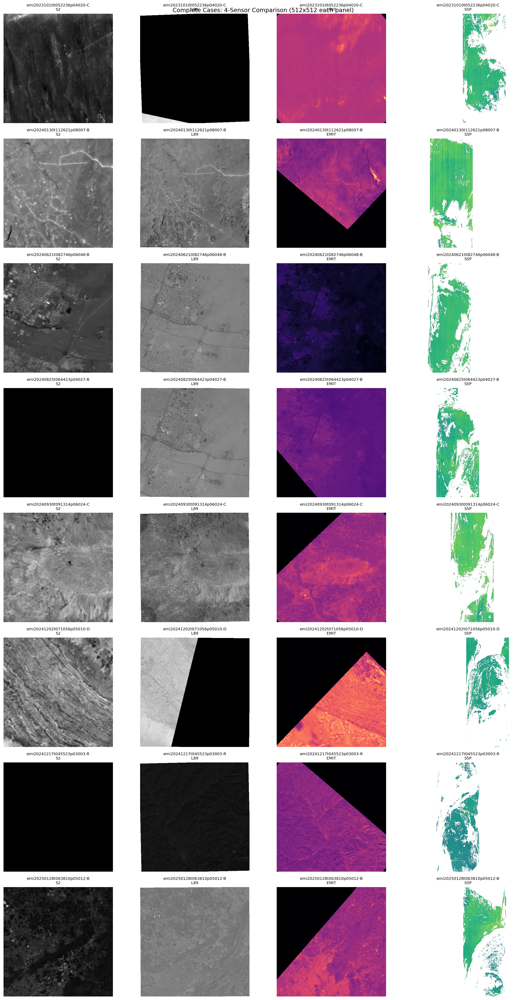

In [7]:
from pathlib import Path
from typing import Dict, Optional

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tifffile

try:
    from netCDF4 import Dataset
except Exception:
    Dataset = None

# ======================
# Notebook configs (edit here)
# ======================
CSV_PATH = "master_multisensor_outer_join.csv"
OUT_DIR = "case_study_complete8_4sensor"
MAX_CASES = 8
TARGET_SIZE = 512

# Optional path remap. Example:
# REWRITE_ROOTS = {
#     "/mnt/engg-leung/Research_No9_Methane_Emissions/Yuyao": "/your/mounted/path/Yuyao"
# }
REWRITE_ROOTS: Dict[str, str] = {}

CH4_CANDIDATES = [
    "methane_mixing_ratio_bias_corrected",
    "methane_mixing_ratio",
    "xch4",
]


def remap_path(path: str, rules: Dict[str, str]) -> str:
    if not isinstance(path, str):
        return ""
    p = path.strip()
    for old, new in rules.items():
        if p.startswith(old):
            return new + p[len(old) :]
    return p


def robust_gray(arr: np.ndarray) -> np.ndarray:
    x = np.asarray(arr)
    if x.ndim == 2:
        return x.astype(np.float32)
    if x.ndim == 3:
        if x.shape[0] <= 32:
            return x[0].astype(np.float32)
        return x[:, :, 0].astype(np.float32)
    raise ValueError(f"Unsupported shape: {x.shape}")


def to_nan_invalid(arr, attrs=None):
    a = np.array(arr, dtype=np.float32, copy=False)
    attrs = attrs or {}
    fv = attrs.get("_FillValue", None)
    mv = attrs.get("missing_value", None)
    if fv is not None:
        a = np.where(a == np.float32(fv), np.nan, a)
    if mv is not None:
        a = np.where(a == np.float32(mv), np.nan, a)
    a = np.where(np.abs(a) > 1e20, np.nan, a)
    if a.ndim == 3:
        a = a[0]
    return a


def read_tif_2d(path: str) -> np.ndarray:
    arr = tifffile.imread(path)
    img = robust_gray(arr)
    if img.shape != (TARGET_SIZE, TARGET_SIZE):
        # keep notebook behavior simple: still display but log mismatch
        return img
    return img


def pick_ch4_var(prod) -> Optional[str]:
    for k in CH4_CANDIDATES:
        if k in prod.variables:
            return k
    return None


def crop_center_with_pad(arr: np.ndarray, cy: int, cx: int, size: int) -> np.ndarray:
    half = size // 2
    y0, y1 = cy - half, cy + half
    x0, x1 = cx - half, cx + half

    out = np.full((size, size), np.nan, dtype=np.float32)

    sy0 = max(0, y0)
    sx0 = max(0, x0)
    sy1 = min(arr.shape[0], y1)
    sx1 = min(arr.shape[1], x1)

    dy0 = sy0 - y0
    dx0 = sx0 - x0
    dy1 = dy0 + (sy1 - sy0)
    dx1 = dx0 + (sx1 - sx0)

    if sy1 > sy0 and sx1 > sx0:
        out[dy0:dy1, dx0:dx1] = arr[sy0:sy1, sx0:sx1]
    return out


def read_s5p_crop(path_nc: str, iy: int, ix: int, size: int = TARGET_SIZE) -> np.ndarray:
    if Dataset is None:
        raise RuntimeError("netCDF4 is not installed")
    with Dataset(path_nc, "r") as ds:
        prod = ds.groups["PRODUCT"]
        ch4 = pick_ch4_var(prod)
        if ch4 is None:
            raise KeyError(f"No CH4 variable found in {path_nc}")
        v = prod.variables[ch4]
        arr = to_nan_invalid(v[:], getattr(v, "__dict__", {})).astype(np.float32)
    return crop_center_with_pad(arr, cy=iy, cx=ix, size=size)


# ======================
# Run
# ======================
out_dir = Path(OUT_DIR)
out_dir.mkdir(parents=True, exist_ok=True)

df = pd.read_csv(CSV_PATH)
mask = df[["has_s2", "has_l89", "has_emit", "has_s5p"]].eq(True).all(axis=1)
sub = (
    df.loc[
        mask,
        [
            "plume_id",
            "datetime",
            "s2_0_std_512",
            "l89_0_std_512",
            "emit_0_simulated_512_path",
            "S5p_path",
            "nearest_iy",
            "nearest_ix",
        ],
    ]
    .sort_values("datetime")
    .head(MAX_CASES)
    .reset_index(drop=True)
)
sub.to_csv(out_dir / "complete_cases_used.csv", index=False)

n = len(sub)
fig, axes = plt.subplots(n, 4, figsize=(16, 3.6 * max(1, n)), dpi=180)
if n == 1:
    axes = np.array([axes])

sensor_cols = [
    ("S2", "s2_0_std_512", "gray"),
    ("L89", "l89_0_std_512", "gray"),
    ("EMIT", "emit_0_simulated_512_path", "magma"),
    ("S5P", "S5p_path", "viridis"),
]

logs = []

for r_idx, row in sub.iterrows():
    pid = row["plume_id"]
    dt = str(row["datetime"])
    iy = int(float(row["nearest_iy"]))
    ix = int(float(row["nearest_ix"]))

    for c_idx, (sensor_name, col, cmap) in enumerate(sensor_cols):
        ax = axes[r_idx, c_idx]
        raw_path = row[col]
        path = remap_path(raw_path, REWRITE_ROOTS)
        status = "ok"
        msg = ""

        try:
            if sensor_name == "S5P":
                img = read_s5p_crop(path, iy=iy, ix=ix, size=TARGET_SIZE)
            else:
                img = read_tif_2d(path)
            ax.imshow(img, cmap=cmap)
            if img.shape != (TARGET_SIZE, TARGET_SIZE):
                status = "shape_mismatch"
                msg = f"shape={img.shape}, expected={(TARGET_SIZE, TARGET_SIZE)}"
        except Exception as e:
            status = "missing_or_error"
            msg = str(e)
            ax.text(0.5, 0.5, f"{sensor_name}\nmissing/error", ha="center", va="center", fontsize=9)

        ax.set_title(f"{pid}\n{sensor_name}", fontsize=8)
        ax.axis("off")
        logs.append(
            {
                "plume_id": pid,
                "datetime": dt,
                "sensor": sensor_name,
                "raw_path": raw_path,
                "used_path": path,
                "status": status,
                "message": msg,
            }
        )

fig.suptitle("Complete Cases: 4-Sensor Comparison (512x512 each panel)", fontsize=12)
fig.tight_layout()
out_png = out_dir / "complete_cases_4sensor_grid_512.png"
fig.savefig(out_png, bbox_inches="tight")

log_df = pd.DataFrame(logs)
log_df.to_csv(out_dir / "render_log_512.csv", index=False)

ok_count = int((log_df["status"] == "ok").sum())
print(f"saved: {out_png}")
print(f"saved: {out_dir / 'complete_cases_used.csv'}")
print(f"saved: {out_dir / 'render_log_512.csv'}")
print(f"rendered_ok_panels: {ok_count}/{len(logs)}")


saved case_study_geoaligned/emi20250128t063810p05012-B_geoaligned_by_s2_true.png
box pixels s2/l89/emit/s5p = 512 171 85 1
s2_mask_exists False /data2/yuyao/methane_emission/carbon_mapper_data_masks/emi20250128t063810p05012-B/resized_512x512.tif
l89_mask_exists True /mnt/engg-leung/Research_No9_Methane_Emissions/Yuyao/Dataset/data_dir_l89_L2SR/plume_masks_l89_512/emi20250128t063810p05012-B/mask_30m_512.tif


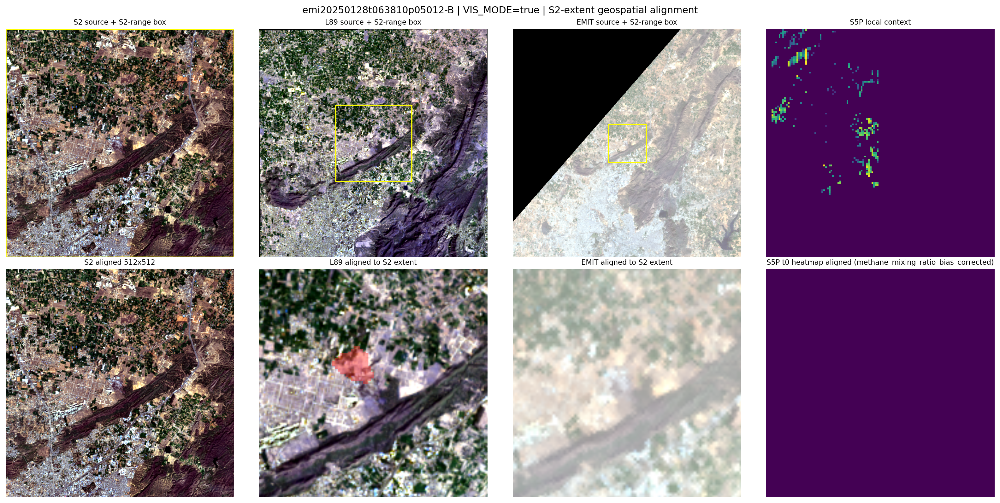

In [ ]:
from pathlib import Path
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tifffile
from netCDF4 import Dataset
from scipy.ndimage import zoom

# ======================
# Notebook configs
# ======================
# emi20231010t052236p04020-C
# emi20240825t064423p04027-B
# emi20241202t071056p05010-D
# emi20241217t045523p03003-R

# emi20240130t112621p08007-B
# emi20240621t082746p06048-B
# emi20240930t091314p06024-C
# emi20250128t063810p05012-B

CASE_ID = "emi20240130t112621p08007-B"
CSV_PATH = "master_multisensor_outer_join.csv"
OUT_DIR = "case_study_geoaligned"
VIS_MODE = "true"  # "true" or "swir"
P_LOW, P_HIGH = 2, 98
TARGET = 512

# meter / pixel
GSD = {
    "s2": 10.0,
    "l89": 30.0,
    "emit": 60.0,
    "s5p": 3500.0,
}

# band index in 0-based order (assume common band ordering)
BANDS = {
    "s2_true": [3, 2, 1],      # B4,B3,B2
    "s2_swir": [11, 10, 8],    # B12,B11,B8A
    "l89_true": [3, 2, 1],     # B4,B3,B2
    "l89_swir": [6, 5, 4],     # B7,B6,B5
    # EMIT/WV3 simulated: pragmatic defaults, adjust if needed
    "emit_true": [4, 2, 1],
    "emit_swir": [15, 10, 7],
}

CH4_KEYS = ["methane_mixing_ratio_bias_corrected", "methane_mixing_ratio", "xch4"]


def resolve_path(p: str) -> str:
    if not isinstance(p, str):
        return ""
    if os.path.exists(p):
        return p
    # optional remap for mask legacy path
    if p.startswith("/data2/yuyao/methane_emission/"):
        alt = p.replace(
            "/data2/yuyao/methane_emission/",
            "/mnt/engg-leung/Research_No9_Methane_Emissions/Yuyao/",
            1,
        )
        if os.path.exists(alt):
            return alt
    return p


def stretch01(x: np.ndarray, p_low=P_LOW, p_high=P_HIGH) -> np.ndarray:
    a = x.astype(np.float32, copy=False)
    if np.all(~np.isfinite(a)):
        return np.zeros_like(a, dtype=np.float32)
    lo, hi = np.nanpercentile(a, [p_low, p_high])
    if not np.isfinite(lo) or not np.isfinite(hi) or hi <= lo:
        lo, hi = np.nanmin(a), np.nanmax(a)
        if not np.isfinite(lo) or not np.isfinite(hi) or hi <= lo:
            return np.zeros_like(a, dtype=np.float32)
    y = (a - lo) / (hi - lo)
    y = np.clip(y, 0.0, 1.0)
    y = np.where(np.isfinite(y), y, 0.0)
    return y.astype(np.float32)


def resize_to(img: np.ndarray, target: int, order: int = 1) -> np.ndarray:
    h, w = img.shape[:2]
    if h == target and w == target:
        return img
    if img.ndim == 2:
        return zoom(img, (target / h, target / w), order=order)
    return zoom(img, (target / h, target / w, 1.0), order=order)


def center_crop(arr: np.ndarray, size: int):
    h, w = arr.shape[:2]
    size = max(1, min(size, h, w))
    cy, cx = h // 2, w // 2
    y0 = max(0, cy - size // 2)
    x0 = max(0, cx - size // 2)
    y1 = min(h, y0 + size)
    x1 = min(w, x0 + size)
    y0 = max(0, y1 - size)
    x0 = max(0, x1 - size)
    return arr[y0:y1, x0:x1], (x0, y0, x1, y1)


def read_hwc(path: str) -> np.ndarray:
    x = tifffile.imread(path)
    if x.ndim == 3:
        if x.shape[2] <= 64:
            return x.astype(np.float32)
        return np.transpose(x, (1, 2, 0)).astype(np.float32)
    if x.ndim == 2:
        return x[:, :, None].astype(np.float32)
    raise ValueError(f"Unsupported TIFF shape: {x.shape}")


def pick_rgb(img_hwc: np.ndarray, idx3):
    c = img_hwc.shape[2]
    safe = [min(max(i, 0), c - 1) for i in idx3]
    rgb = img_hwc[:, :, safe]
    out = np.zeros_like(rgb, dtype=np.float32)
    for k in range(3):
        out[:, :, k] = stretch01(rgb[:, :, k])
    return out


def read_s5p_2d(path_nc: str):
    with Dataset(path_nc, "r") as ds:
        prod = ds.groups["PRODUCT"]
        key = None
        for k in CH4_KEYS:
            if k in prod.variables:
                key = k
                break
        if key is None:
            raise KeyError("No CH4 variable found")
        v = prod.variables[key]
        arr = np.array(v[:], dtype=np.float32)
        attrs = getattr(v, "__dict__", {})
        fv = attrs.get("_FillValue", None)
        mv = attrs.get("missing_value", None)
        if fv is not None:
            arr = np.where(arr == np.float32(fv), np.nan, arr)
        if mv is not None:
            arr = np.where(arr == np.float32(mv), np.nan, arr)
        arr = np.where(np.abs(arr) > 1e20, np.nan, arr)
        if arr.ndim == 3:
            arr = arr[0]
    return arr, key


def overlay_mask(rgb: np.ndarray, mask2d: np.ndarray, color=(1, 0, 0), alpha=0.5):
    out = rgb.copy()
    m = np.isfinite(mask2d) & (mask2d > 0)
    for i in range(3):
        out[:, :, i] = np.where(m, (1 - alpha) * out[:, :, i] + alpha * color[i], out[:, :, i])
    return out


out_dir = Path(OUT_DIR)
out_dir.mkdir(parents=True, exist_ok=True)

df = pd.read_csv(CSV_PATH)
row = df[df["plume_id"] == CASE_ID].iloc[0]

s2 = read_hwc(resolve_path(row["s2_0_std_512"]))
l89 = read_hwc(resolve_path(row["l89_0_std_512"]))
emit = read_hwc(resolve_path(row["emit_0_simulated_512_path"]))

s2_rgb = pick_rgb(s2, BANDS["s2_true"] if VIS_MODE == "true" else BANDS["s2_swir"])
l89_rgb = pick_rgb(l89, BANDS["l89_true"] if VIS_MODE == "true" else BANDS["l89_swir"])
emit_rgb = pick_rgb(emit, BANDS["emit_true"] if VIS_MODE == "true" else BANDS["emit_swir"])

# same geo extent as S2(512 @10m)
box_s2 = TARGET
box_l89 = max(1, int(round(TARGET * GSD["s2"] / GSD["l89"])))
box_emit = max(1, int(round(TARGET * GSD["s2"] / GSD["emit"])))
box_s5p = max(1, int(round(TARGET * GSD["s2"] / GSD["s5p"])))

s2_crop, b2 = center_crop(s2_rgb, box_s2)
l89_crop, b8 = center_crop(l89_rgb, box_l89)
emit_crop, be = center_crop(emit_rgb, box_emit)

# optional masks
s2_mask_path = resolve_path(str(row.get("s2_plume_mask_512_path", "")))
l89_mask_path = resolve_path(str(row.get("l89_mask_512_path", "")))
if os.path.exists(s2_mask_path):
    m = tifffile.imread(s2_mask_path).astype(np.float32)
    if m.ndim == 3:
        m = m[:, :, 0]
    s2m, _ = center_crop(m, box_s2)
    s2_crop = overlay_mask(resize_to(s2_crop, TARGET), resize_to(s2m, TARGET, order=0), color=(1, 0.2, 0.2), alpha=0.45)
else:
    s2_crop = resize_to(s2_crop, TARGET)

if os.path.exists(l89_mask_path):
    m = tifffile.imread(l89_mask_path).astype(np.float32)
    if m.ndim == 3:
        m = m[:, :, 0]
    l89m, _ = center_crop(m, box_l89)
    l89_crop = overlay_mask(resize_to(l89_crop, TARGET), resize_to(l89m, TARGET, order=0), color=(1, 0.2, 0.2), alpha=0.45)
else:
    l89_crop = resize_to(l89_crop, TARGET)

emit_crop = resize_to(emit_crop, TARGET)

s5p2d, s5p_key = read_s5p_2d(resolve_path(row["S5p_path"]))
iy, ix = int(float(row["nearest_iy"])), int(float(row["nearest_ix"]))
# context for drawing box (not whole swath)
s5p_ctx, bs = center_crop(s5p2d[:, :, None], 128)
s5p_ctx = s5p_ctx[:, :, 0]
# aligned crop by S2 extent in S5P pixels
s5p_crop_raw, _ = center_crop(s5p2d[:, :, None], box_s5p)
s5p_crop_raw = s5p_crop_raw[:, :, 0]
s5p_crop = resize_to(stretch01(s5p_crop_raw), TARGET)

# draw box panels
fig, axes = plt.subplots(2, 4, figsize=(18, 9), dpi=180)

# top: source image + bbox
panels_top = [
    (s2_rgb, b2, "S2 source + S2-range box"),
    (l89_rgb, b8, "L89 source + S2-range box"),
    (emit_rgb, be, "EMIT source + S2-range box"),
    (stretch01(s5p_ctx), None, "S5P local context"),
]
for i, (img, box, title) in enumerate(panels_top):
    ax = axes[0, i]
    if i < 3:
        ax.imshow(img)
        x0, y0, x1, y1 = box
        ax.add_patch(plt.Rectangle((x0, y0), x1 - x0, y1 - y0, fill=False, edgecolor="yellow", linewidth=1.5))
    else:
        ax.imshow(img, cmap="viridis")
    ax.set_title(title, fontsize=9)
    ax.axis("off")

# bottom: aligned 512x512
axes[1, 0].imshow(s2_crop)
axes[1, 0].set_title("S2 aligned 512x512", fontsize=9)
axes[1, 1].imshow(l89_crop)
axes[1, 1].set_title("L89 aligned to S2 extent", fontsize=9)
axes[1, 2].imshow(emit_crop)
axes[1, 2].set_title("EMIT aligned to S2 extent", fontsize=9)
axes[1, 3].imshow(s5p_crop, cmap="viridis")
axes[1, 3].set_title(f"S5P t0 heatmap aligned ({s5p_key})", fontsize=9)
for i in range(4):
    axes[1, i].axis("off")

fig.suptitle(f"{CASE_ID} | VIS_MODE={VIS_MODE} | S2-extent geospatial alignment", fontsize=12)
fig.tight_layout()
out = out_dir / f"{CASE_ID}_geoaligned_by_s2_{VIS_MODE}.png"
fig.savefig(out, bbox_inches="tight")
print("saved", out)
print("box pixels s2/l89/emit/s5p =", box_s2, box_l89, box_emit, box_s5p)
print("s2_mask_exists", os.path.exists(s2_mask_path), s2_mask_path)
print("l89_mask_exists", os.path.exists(l89_mask_path), l89_mask_path)
